In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import torch
import glob
import numpy as np

In [2]:
gc   = xr.open_dataset('/glade/derecho/scratch/wchapman/SUMO_GC_test/gc_forecast_1980-01-06-06000.nc', decode_times=False)
nudge = xr.open_dataset('/glade/derecho/scratch/wchapman/SUMO_GC_test/sumo_cam6_nudge.1980-01-06-21600.nc', decode_times=False)
  

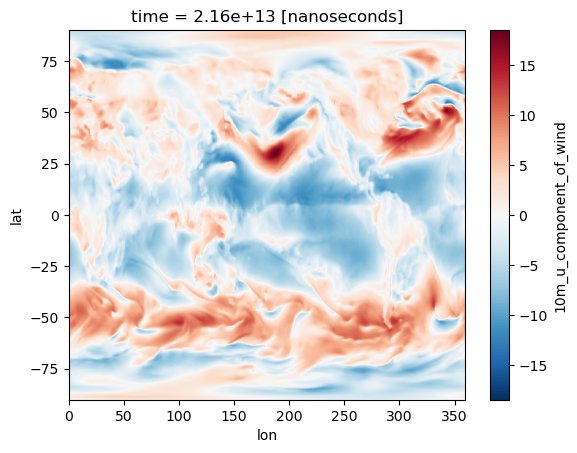

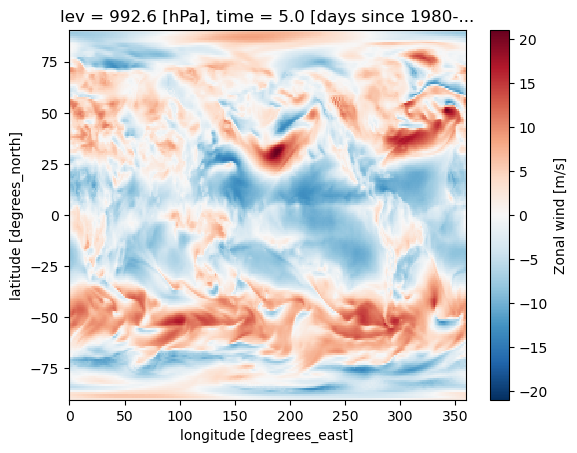

In [10]:
gc['10m_u_component_of_wind'].squeeze().plot()
plt.show()

nudge['U'].isel(lev=-1).squeeze().plot()
plt.show()

In [8]:
nudge

<xarray.Dataset> Size: 29MB
Dimensions:    (lev: 32, ilev: 33, time: 1, nbnd: 2, lat: 192, lon: 288)
Coordinates:
  * lev        (lev) float64 256B 3.643 7.595 14.36 24.61 ... 957.5 976.3 992.6
  * ilev       (ilev) float64 264B 2.255 5.032 10.16 18.56 ... 967.5 985.1 1e+03
  * time       (time) float64 8B 5.0
  * lat        (lat) float64 2kB -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon        (lon) float64 2kB 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
Dimensions without coordinates: nbnd
Data variables: (12/13)
    hyam       (lev) float64 256B ...
    hybm       (lev) float64 256B ...
    P0         float64 8B ...
    hyai       (ilev) float64 264B ...
    hybi       (ilev) float64 264B ...
    date       (time) int32 4B ...
    ...         ...
    time_bnds  (time, nbnd) float64 16B ...
    PS         (time, lat, lon) float32 221kB ...
    Q          (time, lev, lat, lon) float32 7MB ...
    T          (time, lev, lat, lon) float32 7MB ...
    U          (time, lev, lat, lon) float32 7MB ...
    V          (time, lev, lat, lon) float32 7MB ...
Attributes:
    Conventions:       CF-1.0
    source:            CAM
    case:              g.e21.SUMO_CAM6_v03
    logname:           wchapman
    host:              derecho2
    initial_file:      b.e21.BHISTcmip6.f09_g17.LE2-1231.002.cam.i.1980-01-01...
    topography_file:   /glade/campaign/cesm/cesmdata/inputdata/atm/cam/topo/f...
    model_doi_url:     https://doi.org/10.5065/D67H1H0V
    time_period_freq:  hour_6

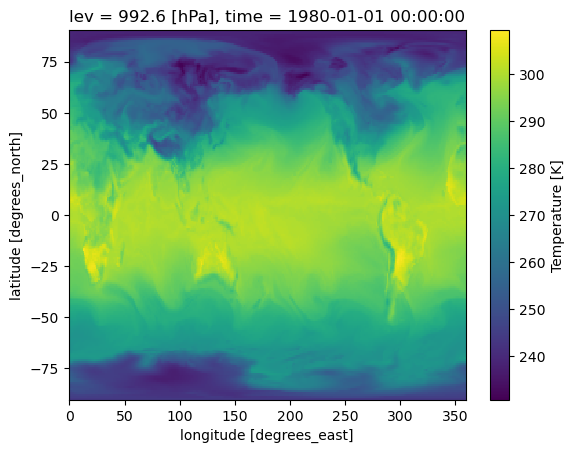

In [7]:
DS = xr.open_dataset('/glade/derecho/scratch/wchapman/g.e21.SUMO_CAM6_v03/run/sumo_cam6_nudge.1000-01-03-21600.nc')
DS['T'].isel(lev=-1).squeeze().plot()
plt.show()

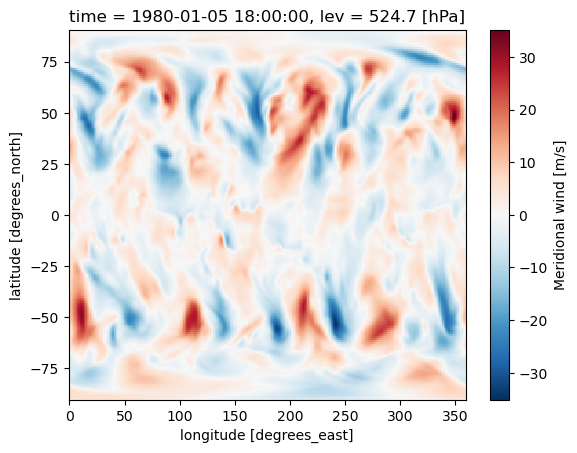

In [9]:
DS = xr.open_dataset('/glade/derecho/scratch/wchapman/g.e21.SUMO_CAM6_v03/run/sumo_cam6_nudge.1000-01-05-64800.nc')
DS['V'].isel(lev=20).squeeze().plot()
plt.show()

In [ ]:
/glade/derecho/scratch/wchapman/g.e21.SUMO_CAM6_v03/run/sumo_cam6_nudge.1000-01-05-43200.nc

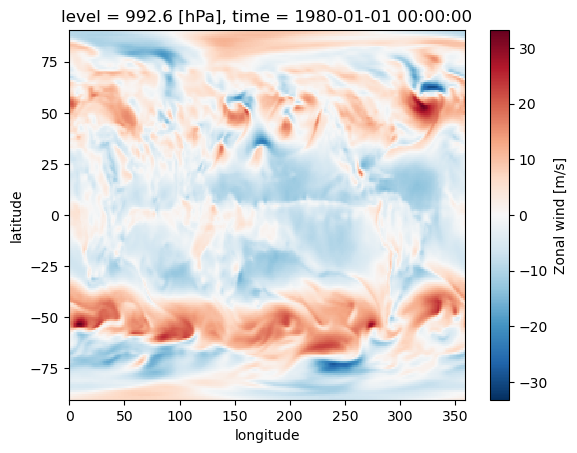

In [3]:
DS = xr.open_zarr('/glade/derecho/scratch/wchapman/b_credit_runs_f32_02/b.e21.CREDIT_climate_branch_1980_1980_zmdata_ERA5scaled_zmdata_Qtot.zarr')
DS.isel(time=0,level=-1)['U'].plot()

In [17]:
ls -lathr /glade/derecho/scratch/wchapman/CREDIT_runs/NEW_CLI_JOHN_CASPER_extended_v2/init_times/

total 58M
drwxr-xr-x 4 wchapman ncar  16K May 26 05:41 ../
drwxr-xr-x 2 wchapman ncar 4.0K May 26 06:34 ./
-rw-r--r-- 1 wchapman ncar  29M May 26 23:13 init_camulator_condition_tensor_1980-01-01T00Z.pth
-rw-r--r-- 1 wchapman ncar  29M May 26 23:35 sumo_init_camulator_condition_tensor_1980-01-01T00Z.pth


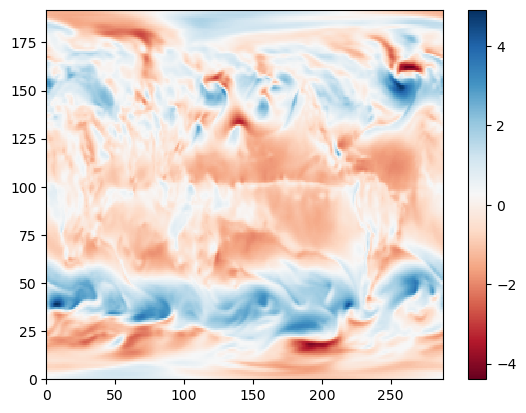

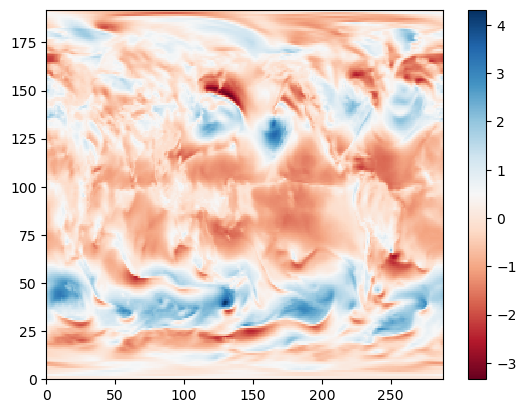

torch.Size([1, 136, 1, 192, 288])


In [16]:
vals=31
bingo = torch.load('/glade/derecho/scratch/wchapman/CREDIT_runs/NEW_CLI_JOHN_CASPER_extended_v2/init_times/init_camulator_condition_tensor_1980-01-01T00Z.pth', weights_only=False)
bongo = torch.load('/glade/derecho/scratch/wchapman/CREDIT_runs/NEW_CLI_JOHN_CASPER_extended_v2/init_times/sumo_init_camulator_condition_tensor_1980-01-01T00Z.pth', weights_only=False)

plt.pcolor(bingo.cpu().squeeze()[vals,:,:], cmap='RdBu')
plt.colorbar()
plt.show()
plt.pcolor(bongo.cpu().squeeze()[vals,:,:], cmap='RdBu')
plt.colorbar()
plt.show()
print(bingo.shape)

In [11]:
136*2

272

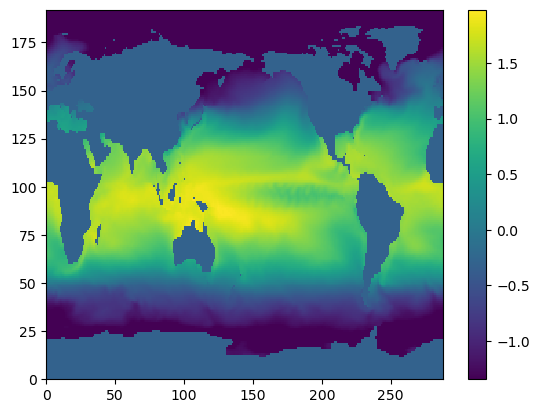

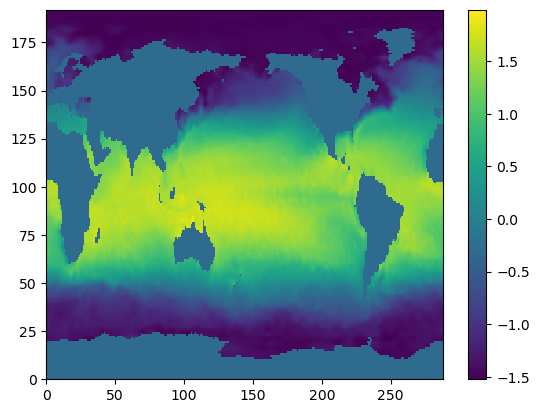

In [15]:
vals=-3
bingo = torch.load('/glade/derecho/scratch/wchapman/g.e30.CAMULATOR_GIAF_v01/run/camulator_diag/input_step0000.pth', weights_only=False)
plt.pcolor(bingo['model_input'].squeeze()[vals,:,:])
plt.colorbar()
plt.show()
bingo = torch.load('/glade/derecho/scratch/wchapman/g.e30.CAMULATOR_GIAF_v01/run/camulator_diag/input_step0001.pth', weights_only=False)
plt.pcolor(bingo['model_input'].squeeze()[vals,:,:])
plt.colorbar()
plt.show()

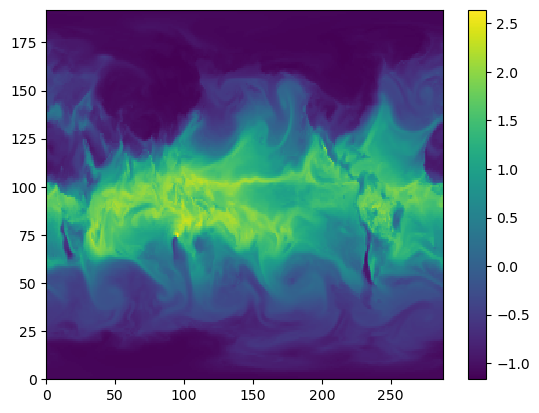

In [96]:
bingo = torch.load('/glade/derecho/scratch/wchapman/g.e30.CAMULATOR_GIAF_v01/run/camulator_diag/input_step0000.pth', weights_only=False)
plt.pcolor(bingo['model_input'].squeeze()[-9,:,:])
plt.colorbar()
plt.show()

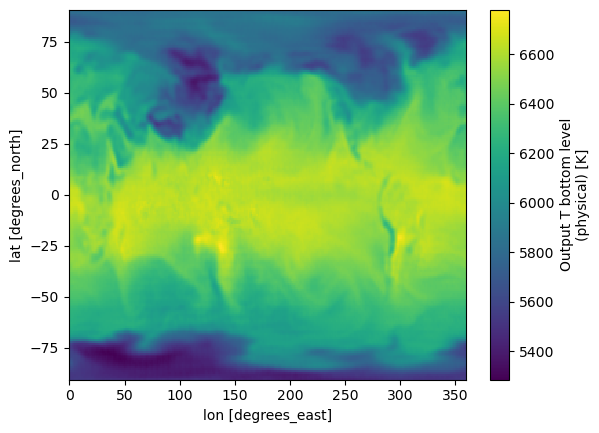

<xarray.Dataset> Size: 2MB
Dimensions:       (lat: 192, lon: 288)
Coordinates:
  * lat           (lat) float32 768B -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
  * lon           (lon) float32 1kB 0.0 1.25 2.5 3.75 ... 356.2 357.5 358.8
Data variables:
    SST_inj       (lat, lon) float32 221kB ...
    ICEFRAC_inj   (lat, lon) float32 221kB ...
    U_in_bot      (lat, lon) float32 221kB ...
    V_in_bot      (lat, lon) float32 221kB ...
    WSPD_in_bot   (lat, lon) float32 221kB ...
    U_out_bot     (lat, lon) float32 221kB ...
    V_out_bot     (lat, lon) float32 221kB ...
    WSPD_out_bot  (lat, lon) float32 221kB ...
    T_out_bot     (lat, lon) float32 221kB ...
    TREFHT_out    (lat, lon) float32 221kB ...
    PS_out        (lat, lon) float32 221kB ...
Attributes:
    step:     1
    ymd:      10101
    tod:      21600

In [72]:
DS1 = xr.open_dataset('/glade/derecho/scratch/wchapman/g.e30.CAMULATOR_GIAF_v01/run/camulator_diag/diag_step0001.nc')
DS1['T_out_bot'].plot()
plt.show()
DS1

In [100]:
bb = xr.open_dataset('/glade/derecho/scratch/wchapman/b_credit_runs/mean_6h_Coupled_1980_2014_32lev_1.0deg_ERA5scaled_F32_Qtot_Mixed_Modal.nc')
bb['ICEFRAC'].values

array(0.11141581)

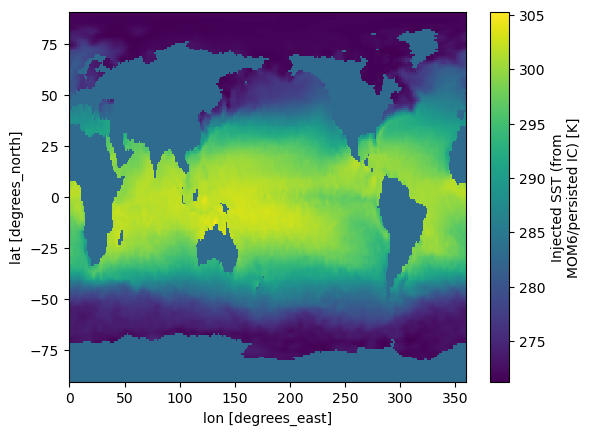

In [10]:
DS1 = xr.open_dataset('/glade/derecho/scratch/wchapman/g.e30.CAMULATOR_GIAF_v01/run/camulator_diag/diag_step0001.nc')
DS1['SST_inj'].plot()

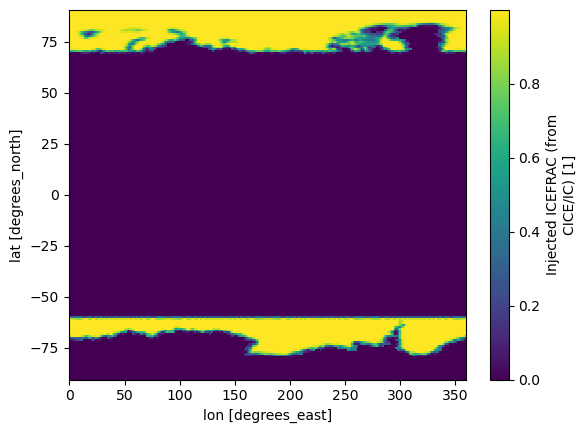

In [12]:
DS1['ICEFRAC_inj'].plot()

In [3]:
DS1 = xr.open_dataset('/glade/derecho/scratch/wchapman/g.e30.CAMULATOR_GIAF_v01/run/camulator_sst_in.nc')
DS1

<xarray.Dataset> Size: 778kB
Dimensions:  (ngrid: 48600)
Dimensions without coordinates: ngrid
Data variables:
    sst      (ngrid) float64 389kB ...
    ifrac    (ngrid) float64 389kB ...
    ymd      int32 4B ...
    tod      int32 4B ...

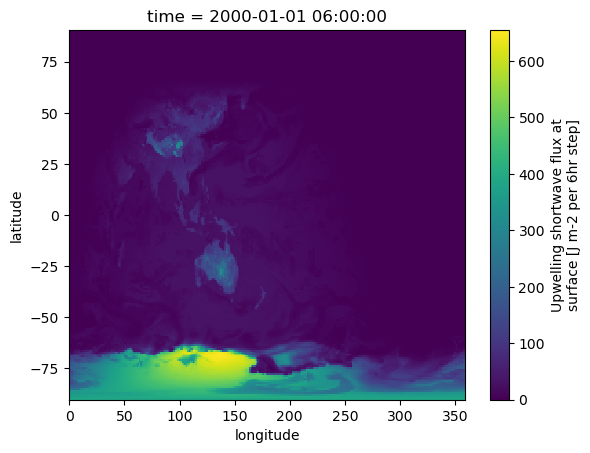

In [11]:
DS1 = xr.open_zarr('/glade/derecho/scratch/wchapman/b_credit_runs_f32_02/b.e21.CREDIT_climate_branch_1980_2000_zmdata_ERA5scaled_zmdata_Qtot.zarr')
(DS1['FSUS'].isel(time=1)/21600.0).plot()
plt.show()

In [61]:
DS1 = xr.open_zarr('/glade/campaign/cisl/aiml/wchapman/MLWPS/STAGING/b.e21.CREDIT_climate_branch_1980_2001_zmdata_ERA5scaled_zmdata_Qtot.zarr')
DS1['SST'].isel(time=0)

DS2 = xr.open_zarr("/glade/derecho/scratch/wchapman/b_credit_runs/b.e21.CREDIT_climate_branch_1980_2001_zmdata_ERA5scaled_zmdata_Qtot.zarr")

DS_forc = xr.open_dataset('/glade/campaign/cisl/aiml/wchapman/MLWPS/STAGING/b.e21.CREDIT_climate_branch_full_climo.nc')
DS_forc['SST'].isel(time=1460)

/glade/work/wchapman/conda-envs/credit-casper-mar2026/lib/python3.11/site-packages/zarr/core/metadata/v2.py:189: UserWarning: Found an empty list of filters in the array metadata document. This is contrary to the Zarr V2 specification, and will cause an error in the future. Use None (or Null in a JSON document) instead of an empty list of filters.
  warnings.warn(msg, UserWarning, stacklevel=1)


<xarray.DataArray 'SST' (latitude: 192, longitude: 288)> Size: 442kB
[55296 values with dtype=float64]
Coordinates:
  * latitude   (latitude) float64 2kB -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
  * longitude  (longitude) float64 2kB 0.0 1.25 2.5 3.75 ... 356.2 357.5 358.8
    time       object 8B 2001-01-01 00:00:00
    dayofyear  int64 8B ...
    hour       int64 8B ...

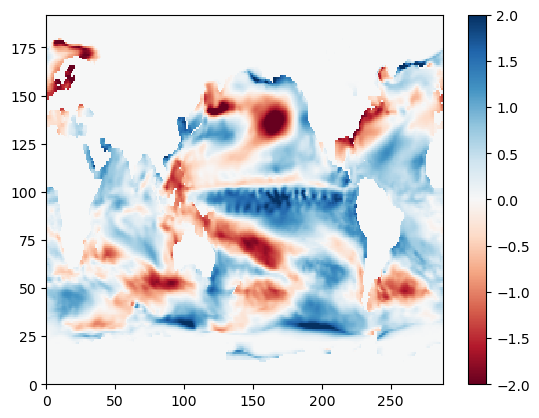

In [62]:
plt.pcolor(DS_forc['SST'].isel(time=1460).values - DS2['SST'].isel(time=0).values,vmin=-2,vmax=2,cmap='RdBu')
plt.colorbar()

In [ ]:
ls -latrh /glade/derecho/scratch/wchapman/CREDIT/climate_extended_v2/

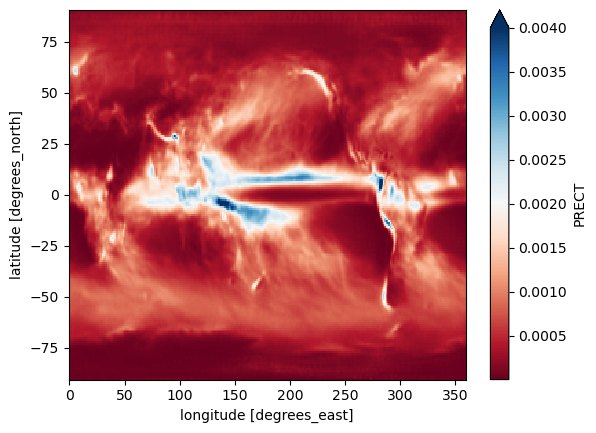

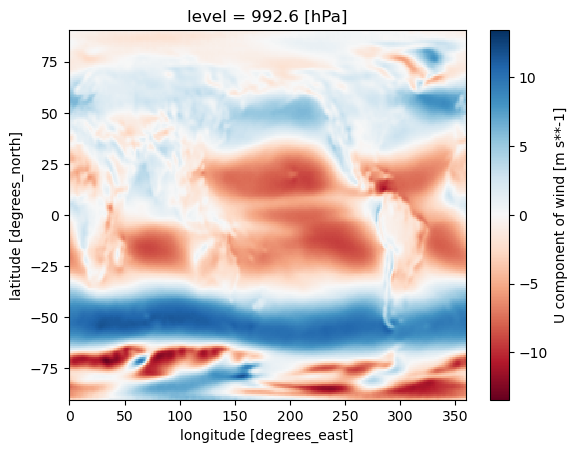

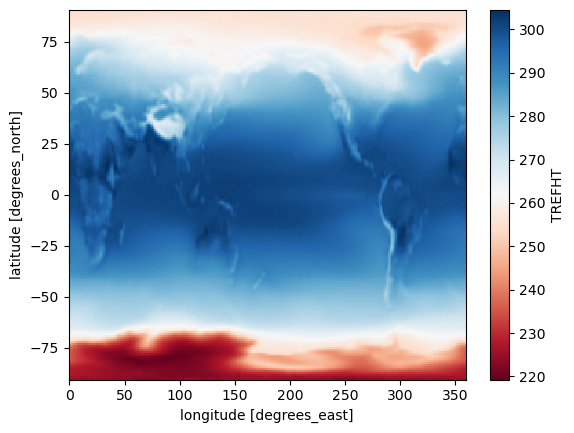

In [19]:
dir_in = '/glade/derecho/scratch/wchapman/CREDIT/climate_extended_v2/run_chkpt00049_forc/2001-01-01T00Z/'
FNS = sorted(glob.glob(dir_in+'pred_2001-01-01T00Z_*.nc'))
ds = xr.open_mfdataset(FNS[:12])

ds['PRECT'].mean('time').squeeze().plot(vmax=0.004,cmap='RdBu')
plt.show()

ds['U'].mean('time').sel(level=1000, method='nearest').squeeze().plot(cmap='RdBu')
plt.show()

ds['TREFHT'].mean('time').squeeze().plot(cmap='RdBu')
plt.show()

In [45]:
import glob
import xarray as xr

paths = sorted(
    glob.glob(
        "/glade/derecho/scratch/wchapman/b_credit_runs/"
        "b.e21.CREDIT_climate_branch_1980_????_zmdata_ERA5scaled_zmdata_Qtot.zarr"
    )
)[-14:-5]

vars_keep = ["TREFHT", "PRECT"]

dsz = xr.open_mfdataset(
    paths,
    engine="zarr",
    combine="by_coords",
    parallel=True,
    chunks={},
    preprocess=lambda x: x[vars_keep],
)



In [14]:
import numpy as np

paths = sorted(
    glob.glob(
        "/glade/derecho/scratch/wchapman/b_credit_runs/"
        "b.e21.CREDIT_climate_branch_1980_????_zmdata_ERA5scaled_zmdata_Qtot.zarr"
    )
)[-14:-5]

vars_keep = ["TREFHT", "PRECT"]

dsz = xr.open_mfdataset(
    paths,
    engine="zarr",
    combine="by_coords",
    parallel=True,
    chunks={},
    preprocess=lambda x: x[vars_keep],
)

bingo = dsz['PRECT'].mean('time').squeeze()
bongo = dsz['TREFHT'].mean('time').squeeze()

best_run = 10000
case = 999 

for ii in range(1):
    for jj in range(5,40):
        dir_in = f'/glade/derecho/scratch/wchapman/CREDIT/climate_extended_v2/run_chkpt000{jj:02}/2001-01-01T00Z/'
        FNS = sorted(glob.glob(dir_in+'pred_2001-01-01T00Z_*.nc'))
        ds2 = xr.open_mfdataset(FNS[:12])
        
        diff = bingo - ds2['PRECT'].mean('time').squeeze()
        w = np.cos(np.deg2rad(diff["latitude"]))
        rmse_prect = np.sqrt((diff**2).weighted(w).mean(("latitude", "longitude")))

        diff = bongo - ds2['TREFHT'].mean('time').squeeze()
        w = np.cos(np.deg2rad(diff["latitude"]))
        rmse_tref = np.sqrt((diff**2).weighted(w).mean(("latitude", "longitude")))
        
        print(ii, jj, rmse_prect.values, rmse_tref.values)

        if rmse.values<best_run:
           best_run = rmse.values
           case = jj
        
print('best run is: ', jj)

# dir_in = '/glade/derecho/scratch/wchapman/CREDIT/climate_extended_v2/run_chkpt00039/2001-01-01T00Z/'
# FNS = sorted(glob.glob(dir_in+'pred_2001-01-01T00Z_*.nc'))
# ds = xr.open_mfdataset(FNS[:12])

dir_in = '/glade/derecho/scratch/wchapman/CREDIT/climate_extended_v2/run_chkpt00010/2001-01-01T00Z/'
FNS = sorted(glob.glob(dir_in+'pred_2001-01-01T00Z_*.nc'))
ds2 = xr.open_mfdataset(FNS[:12])

(bingo - ds2['PRECT'].mean('time').squeeze()).plot(vmin=-.002, vmax=0.002,cmap='RdBu')
plt.show()

In [10]:
paths = sorted(
    glob.glob(
        "/glade/derecho/scratch/wchapman/b_credit_runs/"
        "b.e21.CREDIT_climate_branch_1980_????_zmdata_ERA5scaled_zmdata_Qtot.zarr"
    )
)[-14:-5]

vars_keep = ["TREFHT", "PRECT"]

dsz = xr.open_mfdataset(
    paths,
    engine="zarr",
    combine="by_coords",
    parallel=True,
    chunks={},
    preprocess=lambda x: x[vars_keep],
)

bingo = dsz['PRECT'].mean('time').squeeze().load()
bongo = dsz['TREFHT'].mean('time').squeeze().load()

dszm = dsz['TREFHT'].resample(time='1MS').mean()

bb=20
dir_in = f'/glade/derecho/scratch/wchapman/CREDIT/climate_extended_v2/run_chkpt000{bb:02}_newforc/2001-01-01T00Z/'
FNS = sorted(glob.glob(dir_in+'pred_2001-01-01T00Z_*.nc'))
ds2 = xr.open_mfdataset(FNS, parallel = True)

dszm['time'] = ds2['time'][:-12]

w = np.cos(np.deg2rad(dszm["latitude"]))
brango = dszm.weighted(w).mean(("latitude", "longitude")).load()

In [11]:
ls /glade/derecho/scratch/wchapman/CREDIT/climate_extended_v2/

run_chkpt00000/          run_chkpt00021/          run_chkpt00040/
run_chkpt00001/          run_chkpt00021_newforc/  run_chkpt00040_newforc/
run_chkpt00002/          run_chkpt00022/          run_chkpt00041/
run_chkpt00003/          run_chkpt00022_newforc/  run_chkpt00041_newforc/
run_chkpt00004/          run_chkpt00023/          run_chkpt00042/
run_chkpt00005/          run_chkpt00023_newforc/  run_chkpt00042_newforc/
run_chkpt00005_newforc/  run_chkpt00024/          run_chkpt00043/
run_chkpt00006/          run_chkpt00024_newforc/  run_chkpt00043_newforc/
run_chkpt00006_newforc/  run_chkpt00025/          run_chkpt00044/
run_chkpt00007/          run_chkpt00025_newforc/  run_chkpt00044_newforc/
run_chkpt00007_newforc/  run_chkpt00026/          run_chkpt00045/
run_chkpt00008/          run_chkpt00026_newforc/  run_chkpt00045_newforc/
run_chkpt00008_newforc/  run_chkpt00027/          run_chkpt00046/
run_chkpt00009/          run_chkpt00027_newforc/  run_chkpt00046_newforc/
run_chkpt00009_newfo

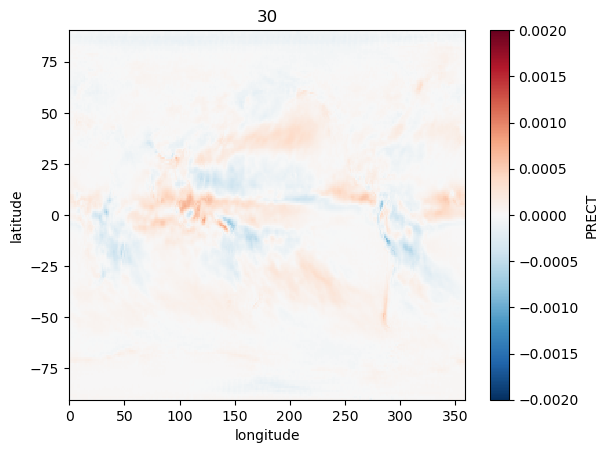

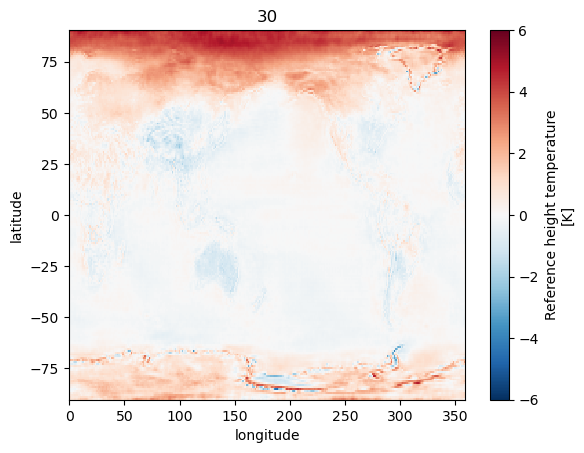

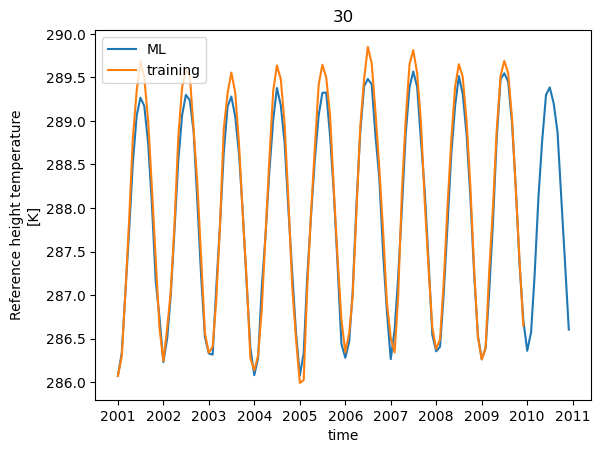

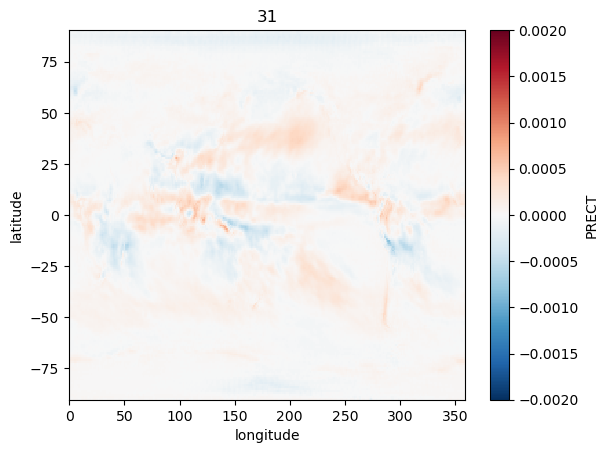

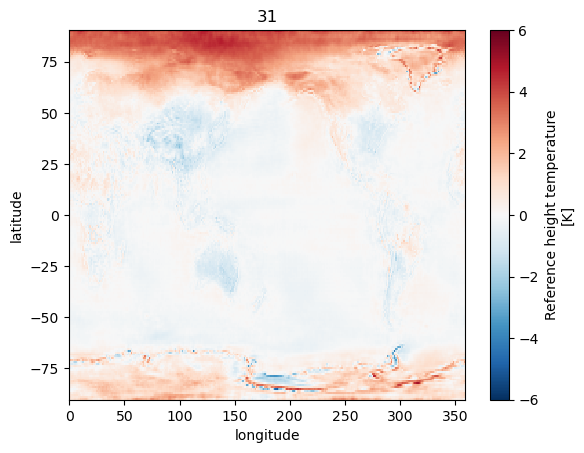

...

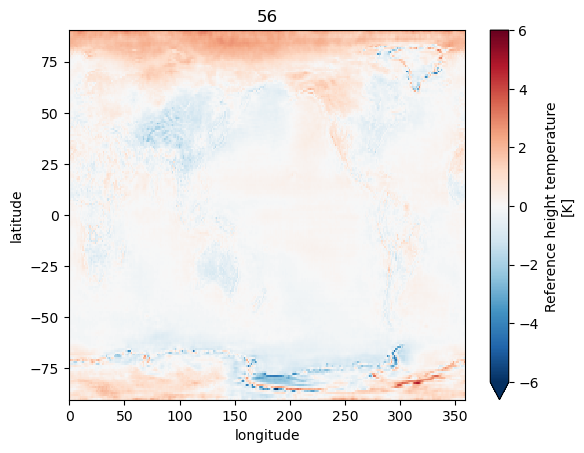

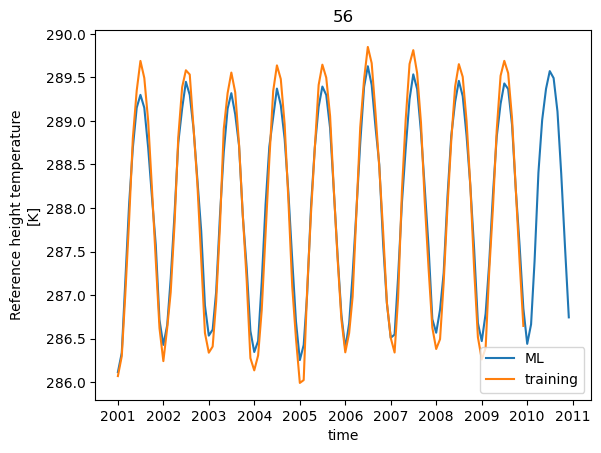

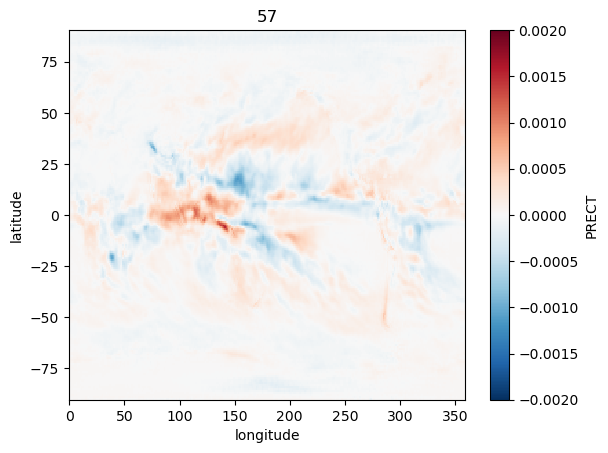

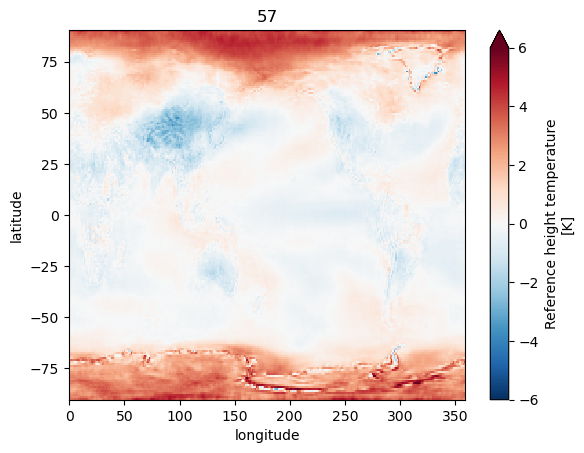

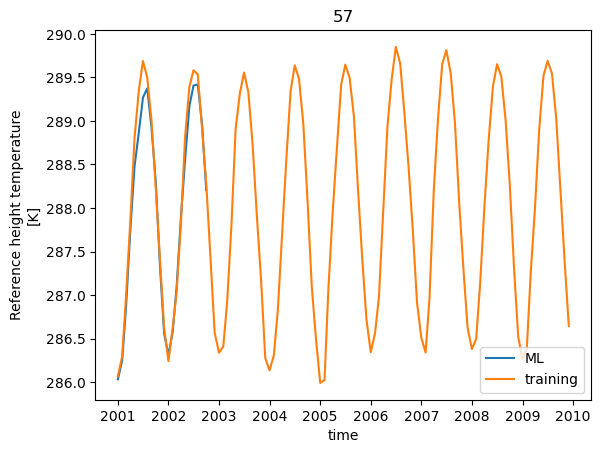

In [16]:
for bb in range(30,58):
    dir_in = f'/glade/derecho/scratch/wchapman/CREDIT/climate_extended_v2/run_chkpt000{bb:02}_newforc/2001-01-01T00Z/'
    FNS = sorted(glob.glob(dir_in+'pred_2001-01-01T00Z_*.nc'))
    ds2 = xr.open_mfdataset(FNS, parallel = True)
    
    (bingo - ds2['PRECT'].mean('time').squeeze()).plot(vmin=-.002, vmax=0.002, cmap='RdBu_r')
    plt.title(str(bb))
    plt.show()
    
    (bongo - ds2['TREFHT'].mean('time').squeeze()).plot(vmin=-6, vmax=6, cmap='RdBu_r')
    plt.title(str(bb))
    plt.show()
    
    ds2['TREFHT'].weighted(w).mean(("latitude", "longitude")).plot(label='ML')
    brango.plot(label='training')
    plt.title(str(bb))
    plt.legend()
    plt.show()
    print('====='*20)

In [96]:
import numpy as np
w = np.cos(np.deg2rad(ds2["latitude"]))
rmse_tref = np.sqrt((ds2**2).weighted(w).mean(("latitude", "longitude")))

In [ ]:
 (bingo - ds2['PRECT'].mean('time').squeeze()).plot(vmin=-.002, vmax=0.002, cmap='RdBu_r')
    plt.title(str(bb))
    plt.show()
    

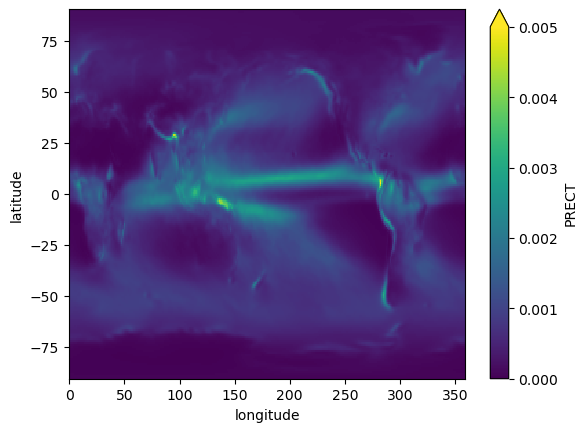

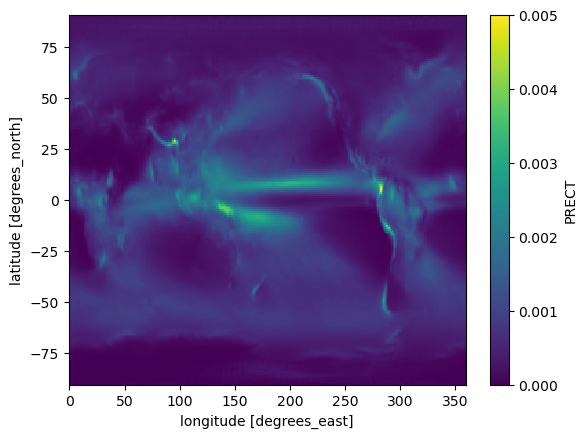

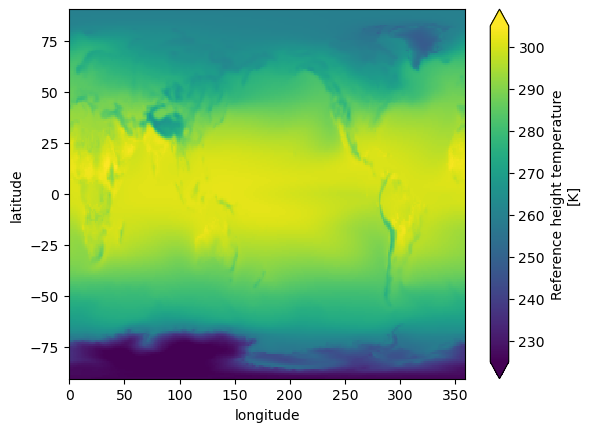

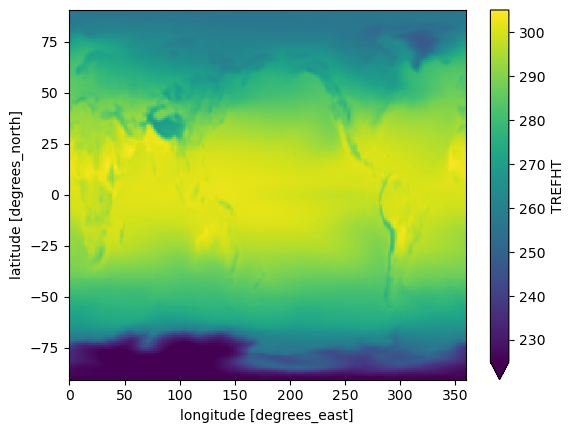

In [123]:
bingo.plot(vmin=0,vmax=0.005)
plt.show()

ds2['PRECT'].mean('time').squeeze().plot(vmin=0,vmax=0.005)
plt.show()

bongo.plot(vmin=225,vmax=305)
plt.show()

ds2['TREFHT'].mean('time').squeeze().plot(vmin=225,vmax=305)
plt.show()

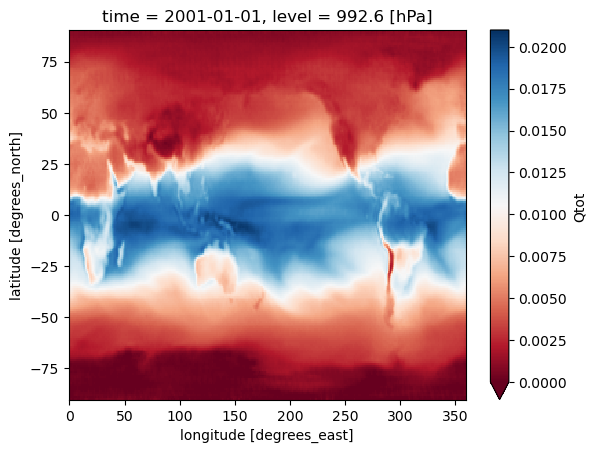

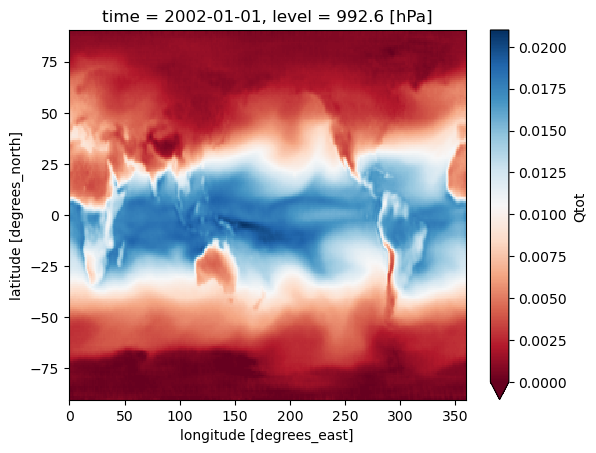

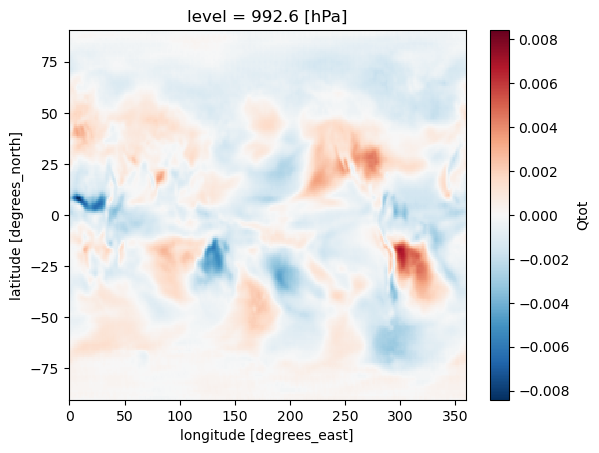

In [21]:
pth_ = '/glade/derecho/scratch/wchapman/CREDIT/climate_extended/epoch23_1yr/2000-01-01T00Z/'
fn_ = 'pred_2000-01-01T00Z_24013.nc'
DS = xr.open_dataset(pth_+fn_)
DS['Qtot'].squeeze().sel(level=1000,method='nearest').plot(vmin=0,vmax=0.021,cmap='RdBu')
plt.show()

pth_ = '/glade/derecho/scratch/wchapman/CREDIT/climate_extended/epoch23_1yr/2000-01-01T00Z/'
fn_ = 'pred_2000-01-01T00Z_24025.nc'
DS2 = xr.open_dataset(pth_+fn_)
DS2['Qtot'].squeeze().sel(level=1000,method='nearest').plot(vmin=0,vmax=0.021,cmap='RdBu')
plt.show()
(DS2['Qtot'].squeeze().sel(level=1000,method='nearest')- DS['Qtot'].squeeze().sel(level=1000,method='nearest')).plot()
plt.show()

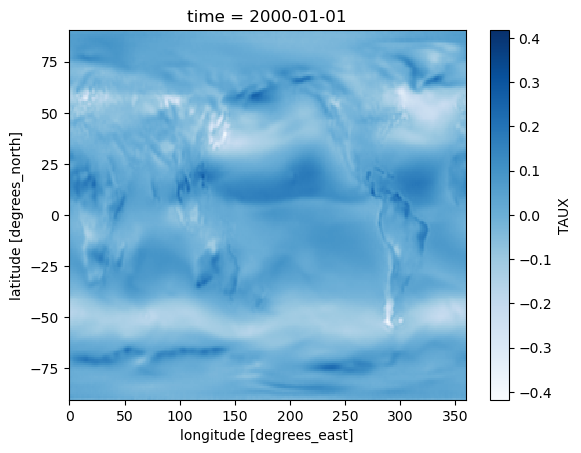

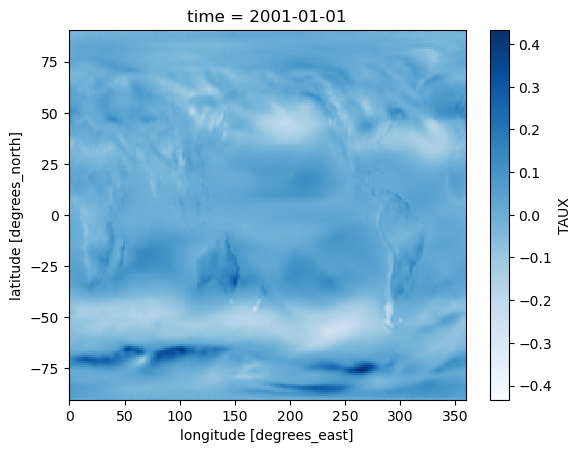

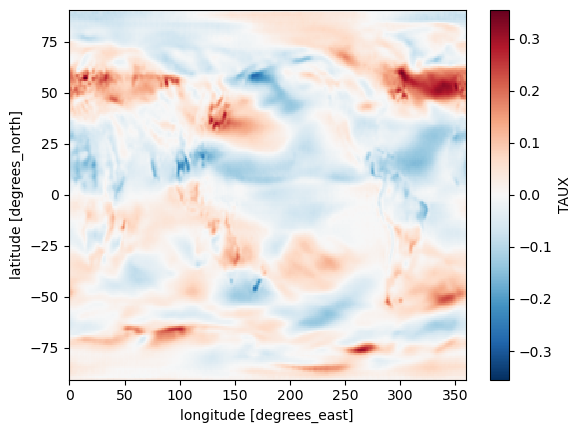

In [30]:
pth_ = '/glade/derecho/scratch/wchapman/CREDIT/climate_extended/epoch23_1yr/2000-01-01T00Z/'
fn_ = 'pred_2000-01-01T00Z_24001.nc'
DS = xr.open_dataset(pth_+fn_)
DS['TAUX'].squeeze().plot(cmap='Blues')
plt.show()

pth_ = '/glade/derecho/scratch/wchapman/CREDIT/climate_extended/epoch23_1yr/2000-01-01T00Z/'
fn_ = 'pred_2000-01-01T00Z_24013.nc'
DS2 = xr.open_dataset(pth_+fn_)
DS2['TAUX'].squeeze().plot(cmap='Blues')
plt.show()
(DS2['TAUX'].squeeze()- DS['TAUX'].squeeze()).plot()
plt.show()

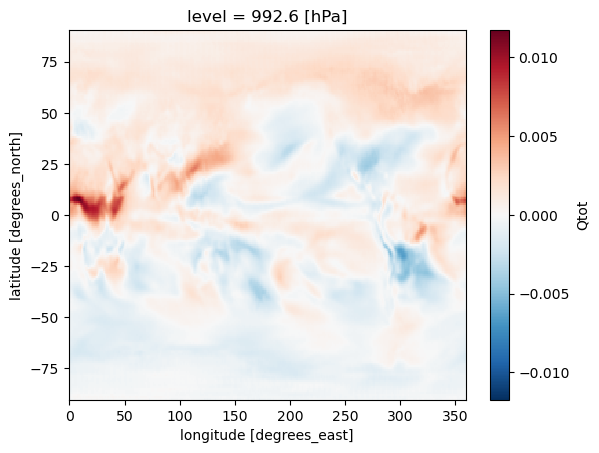

In [6]:
(DS2['Qtot'].squeeze().sel(level=1000,method='nearest')- DS['Qtot'].squeeze().sel(level=1000,method='nearest')).plot()


In [87]:
DS['Qtot'].squeeze().sel(level=200,method='nearest').max()

<xarray.DataArray 'Qtot' ()> Size: 8B
array(0.00012417)
Coordinates:
    time     datetime64[ns] 8B 2000-01-01
    level    float64 8B 197.9

   step             datetime  qtot_global_total_norm
0     1  2000-01-01 00:00:00          -241802.421875
1     2  2000-01-01 06:00:00          -235992.156250
2     3  2000-01-01 12:00:00          -230974.828125
3     4  2000-01-01 18:00:00          -226427.031250
4     5  2000-01-02 00:00:00          -224285.140625


<Axes: >

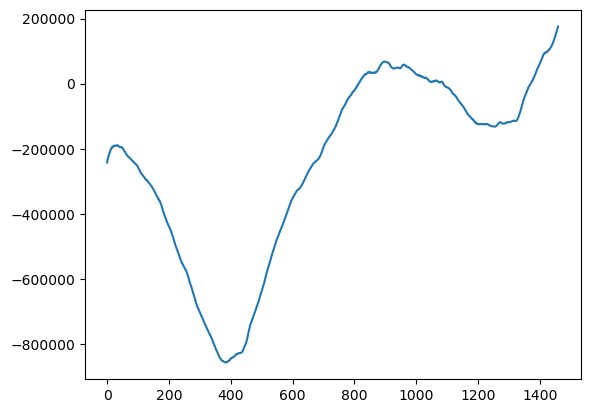

In [12]:
import pandas as pd

df = pd.read_csv('/glade/derecho/scratch/wchapman/CREDIT/climate_extended/epoch23_1yr/moisture_tracking.csv')
print(df.head())
df['qtot_global_total_norm'].plot()

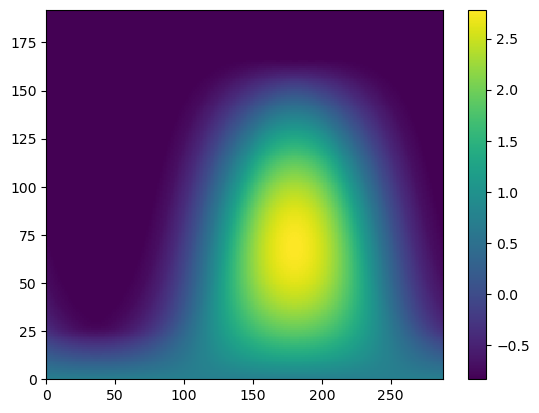

torch.Size([1, 136, 1, 192, 288])


In [35]:
x1=torch.load('/glade/derecho/scratch/wchapman/CAMULATOR_FORCING/init_be21_condition_tensor_2000-01-01T00Z.pth',map_location='cpu')
plt.pcolor(x1[0,:].squeeze()[132,:,:])
plt.colorbar()
plt.show()
print(x1.shape)

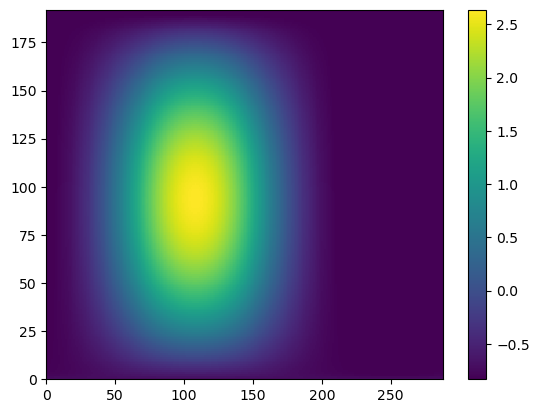

In [26]:
x1=torch.load('/glade/derecho/scratch/wchapman/x1tensor.pt',map_location='cpu')
plt.pcolor(x1[0,:].squeeze()[130,:,:])
plt.colorbar()
plt.show()


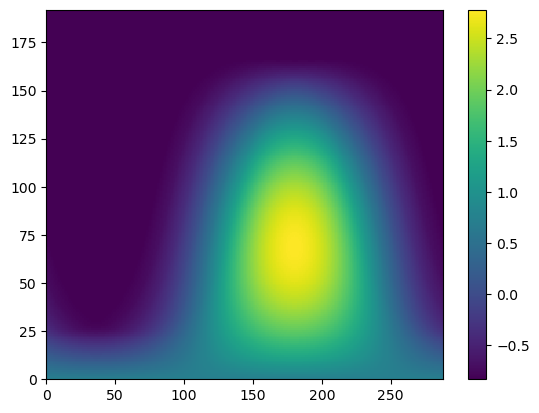

In [5]:
x1=torch.load('/glade/derecho/scratch/wchapman/CREDIT_runs/wxformermod_sharp_SpatPS_pxshf/init_times/init_camulator_condition_tensor_1983-01-01T00Z.pth',map_location='cpu')
x1.shape
plt.pcolor(x1.squeeze()[130,:,:])
plt.colorbar()
plt.show() #shows SOLIN

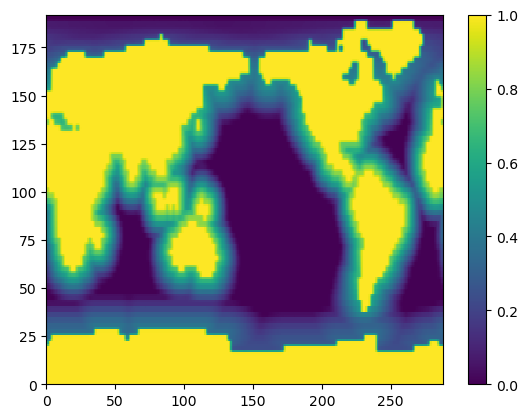

In [19]:
x1=torch.load('/glade/derecho/scratch/wchapman/x1tensor.pt',map_location='cpu')
plt.pcolor(x1[0,:].squeeze()[135,:,:])
plt.colorbar()
plt.show()

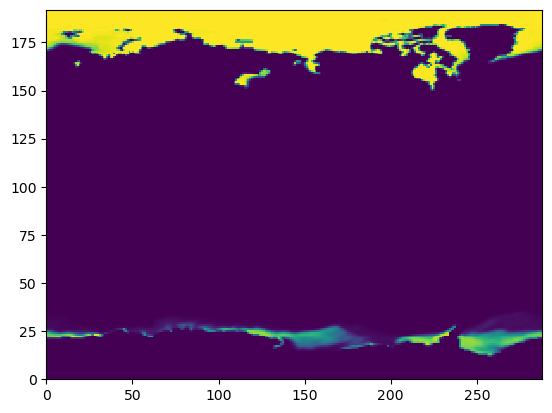

In [13]:
plt.pcolor(x1[0,:].squeeze()[132,:,:])
plt.show()

In [18]:
ls -lathr /glade/derecho/scratch/wchapman/CREDIT/climate_new_ckpt/small_model_test_001/1983-01-01T00Z/

total 2.7G
-rw-r--r-- 1 wchapman ncar  62M Apr  7 17:13 pred_1983-01-01T00Z_024.nc
-rw-r--r-- 1 wchapman ncar  62M Apr  7 17:13 pred_1983-01-01T00Z_018.nc
-rw-r--r-- 1 wchapman ncar  62M Apr  7 17:13 pred_1983-01-01T00Z_012.nc
-rw-r--r-- 1 wchapman ncar  62M Apr  7 17:13 pred_1983-01-01T00Z_006.nc
drwxr-xr-x 3 wchapman ncar 4.0K Apr  7 17:13 ../
-rw-r--r-- 1 wchapman ncar  62M Apr  7 17:13 pred_1983-01-01T00Z_072.nc
-rw-r--r-- 1 wchapman ncar  62M Apr  7 17:13 pred_1983-01-01T00Z_066.nc
-rw-r--r-- 1 wchapman ncar  62M Apr  7 17:13 pred_1983-01-01T00Z_060.nc
-rw-r--r-- 1 wchapman ncar  62M Apr  7 17:13 pred_1983-01-01T00Z_054.nc
-rw-r--r-- 1 wchapman ncar  62M Apr  7 17:13 pred_1983-01-01T00Z_048.nc
-rw-r--r-- 1 wchapman ncar  62M Apr  7 17:13 pred_1983-01-01T00Z_042.nc
-rw-r--r-- 1 wchapman ncar  62M Apr  7 17:13 pred_1983-01-01T00Z_036.nc
-rw-r--r-- 1 wchapman ncar  62M Apr  7 17:13 pred_1983-01-01T00Z_030.nc
-rw-r--r-- 1 wchapman ncar  62M Apr  7 17:13 pred_1983-01-01T00Z_108.nc
-rw-

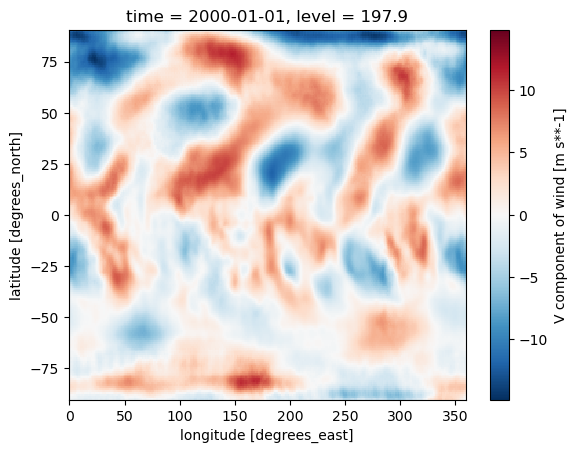

In [32]:
DS =xr.open_dataset('/glade/derecho/scratch/wchapman/CREDIT/climate_new_ckpt/small_model_test_001/1983-01-01T00Z//pred_1983-01-01T00Z_24001.nc')
DS.squeeze().sel(level=200, method='nearest')['V'].plot()
plt.savefig('camulator_pred.png')
plt.show()
# DSz = xr.open_zarr('/glade/campaign/cisl/aiml/wchapman/MLWPS/STAGING/b.e21.CREDIT_climate_branch_1980_2000_zmdata_ERA5scaled_zmdata_Qtot.zarr')
# DSz['Qtot'].isel(time=2).sel(level=900, method='nearest').plot()
# plt.savefig('cam_example_pred.png')
# plt.show()
# DSz = xr.open_zarr('/glade/campaign/cisl/aiml/wchapman/MLWPS/STAGING/b.e21.CREDIT_climate_branch_1980_2000_zmdata_ERA5scaled_zmdata_Qtot.zarr')
# DSz['Qtot'].isel(time=2).sel(level=900, method='nearest').plot()

In [7]:
DS.squeeze().sel(level=900, method='nearest')['PRECT'].min()

<xarray.DataArray 'PRECT' ()> Size: 8B
array(-4.23742402e-11)
Coordinates:
    time     datetime64[ns] 8B 2000-01-01
    level    float64 8B 912.6

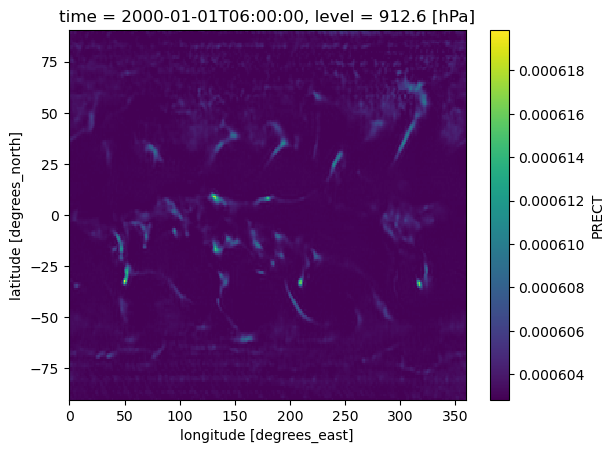

In [8]:
DS =xr.open_dataset('/glade/derecho/scratch/wchapman/CREDIT/climate_new_ckpt/run_cp068_monthly/2000-01-01T00Z/pred_2000-01-01T00Z_012.nc')
DS.squeeze().sel(level=900, method='nearest')['PRECT'].plot()
plt.savefig('precty.png')

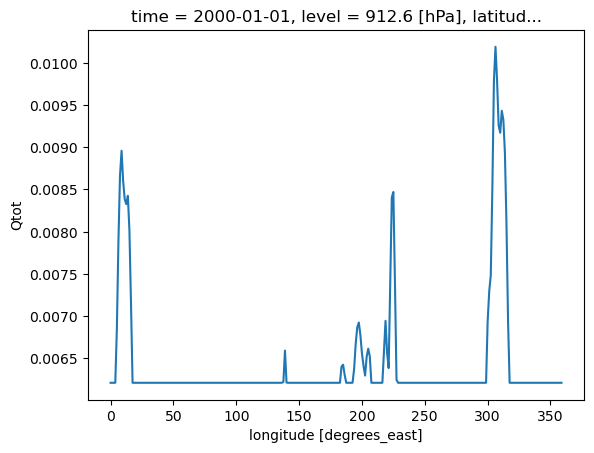

In [6]:
DS =xr.open_dataset('/glade/derecho/scratch/wchapman/CREDIT/climate_new_ckpt/run_cp068_monthly/2000-01-01T00Z/pred_2000-01-01T00Z_006.nc')
DS.squeeze().sel(level=900, latitude=40, method='nearest')['Qtot'].plot()
plt.show()

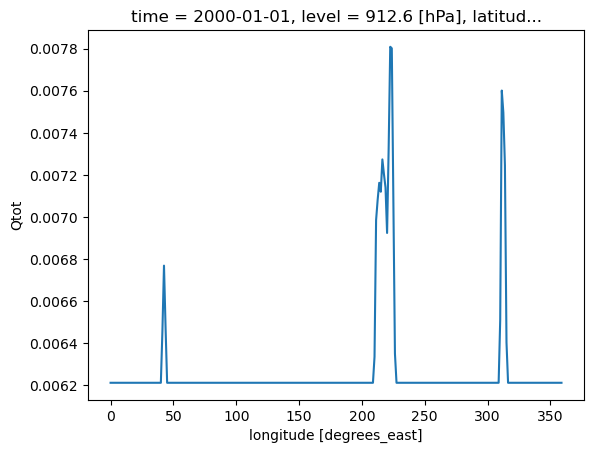

In [59]:
DS.squeeze().sel(level=900, latitude=50, method='nearest')['Qtot'].plot()

In [15]:
# mean_path: '/glade/derecho/scratch/wchapman/b_credit_runs/mean_6h_Coupled_1980_2014_32lev_1.0deg_ERA5scaled_F32_Qtot_Mixed_Modal.nc'
# mean_path: '/glade/campaign/cisl/aiml/wchapman/MLWPS/STAGING/mean_6h_1980_Coupled_2000_2012_32lev_1.0deg_ERA5scaled_F32_Qtot_Mixed_Modal.nc'

# std_path: '/glade/derecho/scratch/wchapman/b_credit_runs/std_6h_Coupled_1980_2014_32lev_1.0deg_ERA5scaled_F32_Qtot_Mixed_Modal.nc'
# std_path: '/glade/campaign/cisl/aiml/wchapman/MLWPS/STAGING/std_6h_1980_Coupled_2000_2012_32lev_1.0deg_ERA5scaled_F32_Qtot_Mixed_Modal.nc'


DSm1 = xr.open_dataset('/glade/derecho/scratch/wchapman/b_credit_runs/mean_6h_Coupled_1980_2014_32lev_1.0deg_ERA5scaled_F32_Qtot_Mixed_Modal.nc')
DSm2 = xr.open_dataset('/glade/campaign/cisl/aiml/wchapman/MLWPS/STAGING/mean_6h_1980_Coupled_2000_2012_32lev_1.0deg_ERA5scaled_F32_Qtot_Mixed_Modal.nc')
DSs1 = xr.open_dataset('/glade/derecho/scratch/wchapman/b_credit_runs/std_6h_Coupled_1980_2014_32lev_1.0deg_ERA5scaled_F32_Qtot_Mixed_Modal.nc')
DSs2 = xr.open_dataset('/glade/campaign/cisl/aiml/wchapman/MLWPS/STAGING/std_6h_1980_Coupled_2000_2012_32lev_1.0deg_ERA5scaled_F32_Qtot_Mixed_Modal.nc')

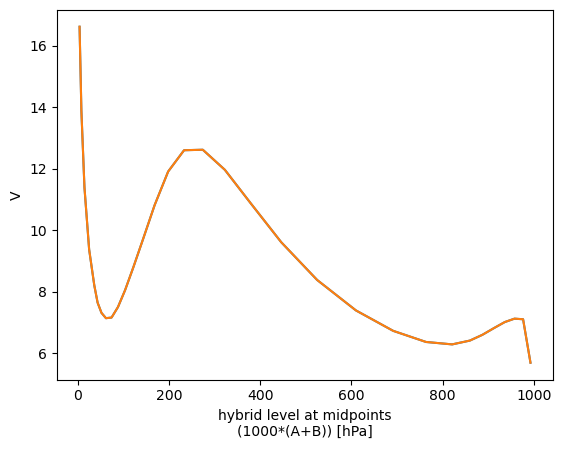

In [18]:
DSs1['V'].plot()
DSs2['V'].plot()